In [1]:
import os
import cv2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
cwd = os.getcwd()

%matplotlib inline

import io
import base64

from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Camera Calibration

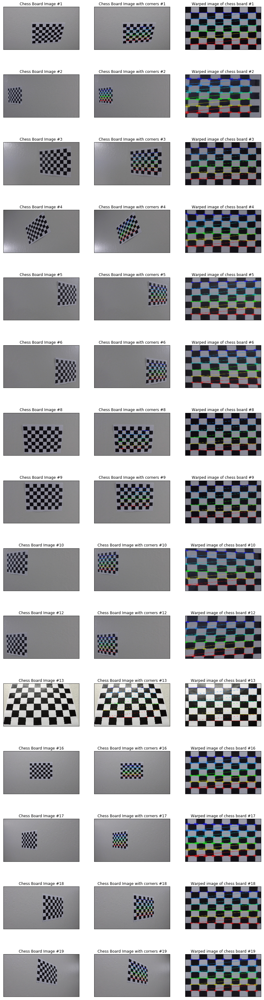

In [2]:
img_dir = "./camera_cal"

camera_matArray = []
distortion_matArray = []
chessBoard = []
nx = 9
ny = 6
items = os.listdir(img_dir)
for names in items:
    if names.endswith(".png") or names.endswith(".jpg"):
        img = mpimg.imread(os.path.join(img_dir,names))
        chessBoard.append(img)

f,ax = plt.subplots(15,3,figsize=(15,60))

image_points = []
object_points = []

obj_p = np.zeros((nx*ny,3), np.float32)
obj_p[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

ind = 0
for i in range(len(chessBoard)):
    img = np.copy(chessBoard[i])
    gray = cv2.cvtColor(chessBoard[i], cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        image_points.append(corners)
        object_points.append(obj_p)
        ret2, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, gray.shape[::-1], None, None)
        camera_matArray.append(mtx)
        distortion_matArray.append(dist)
        img_dist = cv2.undistort(img, mtx, dist, None, mtx)
        img_gray = cv2.cvtColor(img_dist, cv2.COLOR_BGR2GRAY)
        ret1, corners1 = cv2.findChessboardCorners(img_gray, (nx,ny) , None)
    
        cv2.drawChessboardCorners(img_dist, (nx,ny), corners1, ret1)
        if ret1 == True:
            src = np.float32([corners1[0],corners1[nx-1],corners1[-1],corners1[-nx]])
            ht = img.shape[0]
            wdt = img.shape[1]
            offset = 100 # offset for dst points
            # Grab the image shape
            img_size = (gray.shape[1], gray.shape[0])

            # For source points I'm grabbing the outer four detected corners
            src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
            # For destination points, I'm arbitrarily choosing some points to be
            # a nice fit for displaying our warped result 
            # again, not exact, but close enough for our purposes
            dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                              [img_size[0]-offset, img_size[1]-offset], 
                              [offset, img_size[1]-offset]])
            M = cv2.getPerspectiveTransform(src,dst)
            warped = cv2.warpPerspective(img_dist, M, (img.shape[1],img.shape[0]))#, flags=cv2.INTER_LINEAR)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            ax[ind,0].imshow(chessBoard[i])
            ax[ind,1].imshow(img)    
            ax[ind,2].imshow(warped)
            ax[ind,0].set_xticks([])
            ax[ind,0].set_yticks([])
            ax[ind,0].set_title("Chess Board Image #" + str(i))

            ax[ind,1].set_xticks([])
            ax[ind,1].set_yticks([])
            ax[ind,1].set_title("Chess Board Image with corners #" + str(i))

            ax[ind,2].set_xticks([])
            ax[ind,2].set_yticks([])
            ax[ind,2].set_title("Warped image of chess board #" + str(i))           
            ind = ind + 1

## Camera & Distortion Matrices
We take the average of the camera & distortion matrices from all the images to get the overall camera matrix

In [3]:
camera_matrix = np.zeros(np.shape(camera_matArray[0]))
distortion_matrix = np.zeros(np.shape(distortion_matArray[0]))
for i in range(len(camera_matArray)):
    camera_matrix = camera_matrix + np.array(camera_matArray[i])/len(camera_matArray)
    distortion_matrix = distortion_matrix + np.array(distortion_matArray[i])/len(distortion_matArray)

## Step 0: Load The Test Data

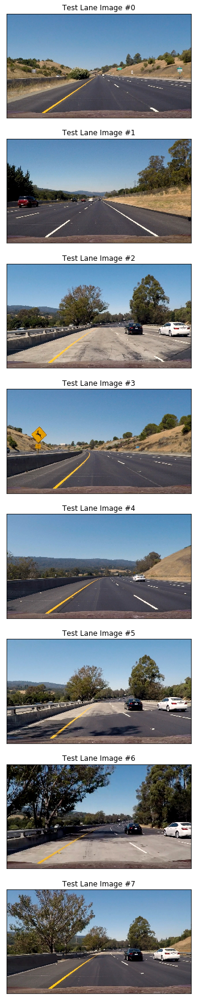

In [4]:
img_dir = "./test_images"
                
lanes = []

items = os.listdir(img_dir)
for names in items:
    if names.endswith(".png") or names.endswith(".jpg"):
        img = mpimg.imread(os.path.join(img_dir,names))
        lanes.append(img)

f,ax = plt.subplots(len(lanes),1,figsize=(20,30))
for i in range(len(lanes)):
    ax[i].imshow(lanes[i])   
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title("Test Lane Image #" + str(i))

## Step 1: Changing Color Space

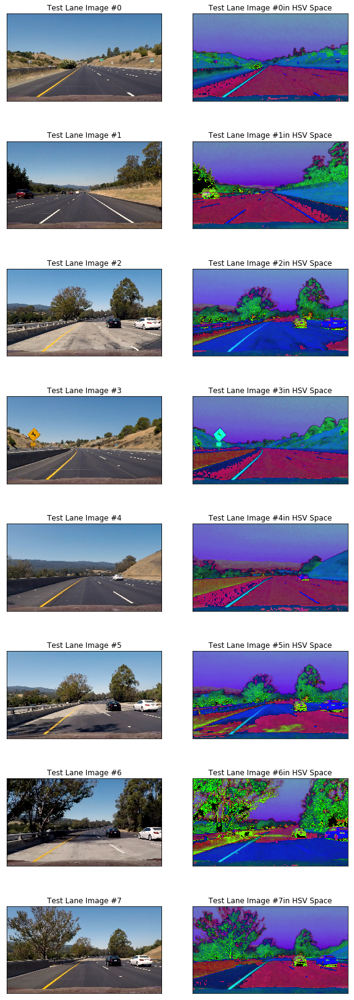

In [5]:
HSV_image = []
f,ax = plt.subplots(len(lanes),2,figsize=(10,30))
for i in range(len(lanes)):
    HSV_image.append(cv2.cvtColor(lanes[i], cv2.COLOR_RGB2HSV))
    ax[i,0].imshow(lanes[i])  
    ax[i,1].imshow(HSV_image[i])
    ax[i,0].set_xticks([])
    ax[i,0].set_yticks([])
    ax[i,0].set_title("Test Lane Image #" + str(i))
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Test Lane Image #" + str(i) + "in HSV Space")    

## Step 1a: Analyzing HSV channels

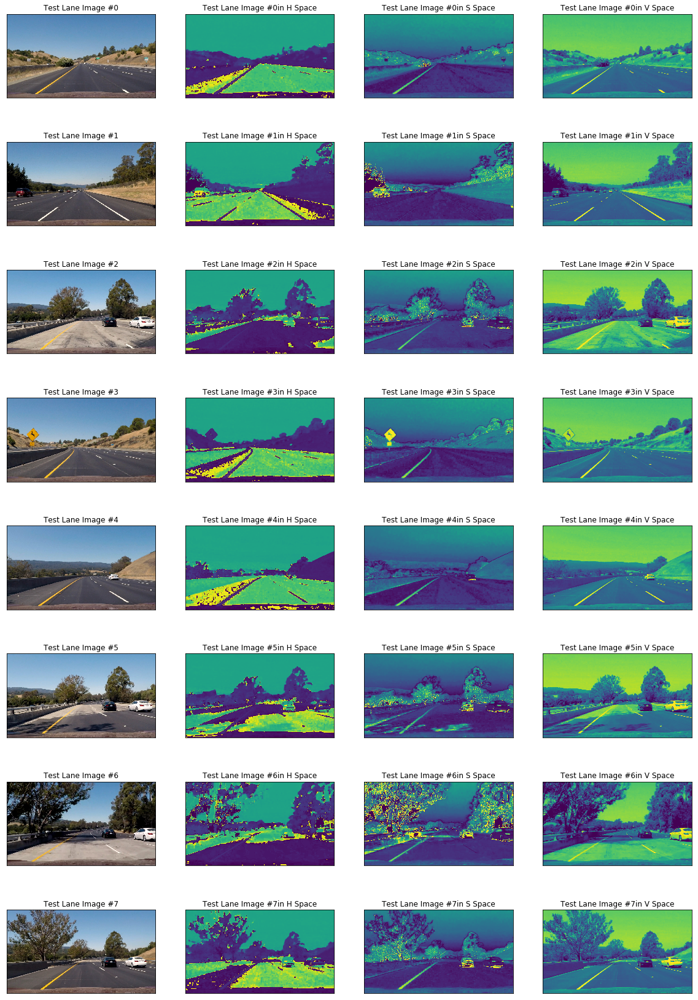

In [6]:
H_channel = []
S_channel = []
V_channel = []
f,ax = plt.subplots(len(lanes),4,figsize=(20,30))
for i in range(len(lanes)):
    H_channel.append(HSV_image[i][:,:,0])
    S_channel.append(HSV_image[i][:,:,1])
    V_channel.append(HSV_image[i][:,:,2])
    ax[i,0].imshow(lanes[i])  
    ax[i,1].imshow(H_channel[i])
    ax[i,2].imshow(S_channel[i])
    ax[i,3].imshow(V_channel[i])    
    ax[i,0].set_xticks([])
    ax[i,0].set_yticks([])
    ax[i,0].set_title("Test Lane Image #" + str(i))
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Test Lane Image #" + str(i) + "in H Space") 
    ax[i,2].set_xticks([])
    ax[i,2].set_yticks([])
    ax[i,2].set_title("Test Lane Image #" + str(i) + "in S Space")     
    ax[i,3].set_xticks([])
    ax[i,3].set_yticks([])
    ax[i,3].set_title("Test Lane Image #" + str(i) + "in V Space")         

### Hue Channel
Comparing the raw image with the H channel images above, the hue channel can be seen to be good in differentiating colors and certainly identifies lane lines on dark roads well, but not very useful in identifying lane lines, since the hue, by itself, cannot distinguish white roads from the lane lines (See images 2,5,6 above).

### Saturation Channel
The saturation channel seems to pick out the yellow lane lines pretty well while darkening the white ones. It also clearly distinguishes the shadows (as seen under the cars and the trees, eg. image 4). The saturation channel has potential to distinguish and identify lane lines through different thresholds may have to be applied to get the yellow and the white lane lines

### Value Channel
This channel seems to uniformly distinguish both the yellow & white lane lines from other objects in the images. This clearly has the most potential.

In the next step, we ignore the Hue channel, and experiment with thresholding the Saturation and value channels.

## Step 1b: Thresholding
Thresholding the saturation levels requires separate thresholds for white and yellow lane lines. By experiment, it was seen that pixels with saturation values between 150 & 250 distinguished the yellow lines better and pixels with saturation values between 0-15 distinguished the white lines. Thus a weighted average of the two identified the lanes lines the best.

Again, by trial and error, it was found that pixels with values greater than 230 identified the lanes lines the best for the test images. These can be seen in the plot below.

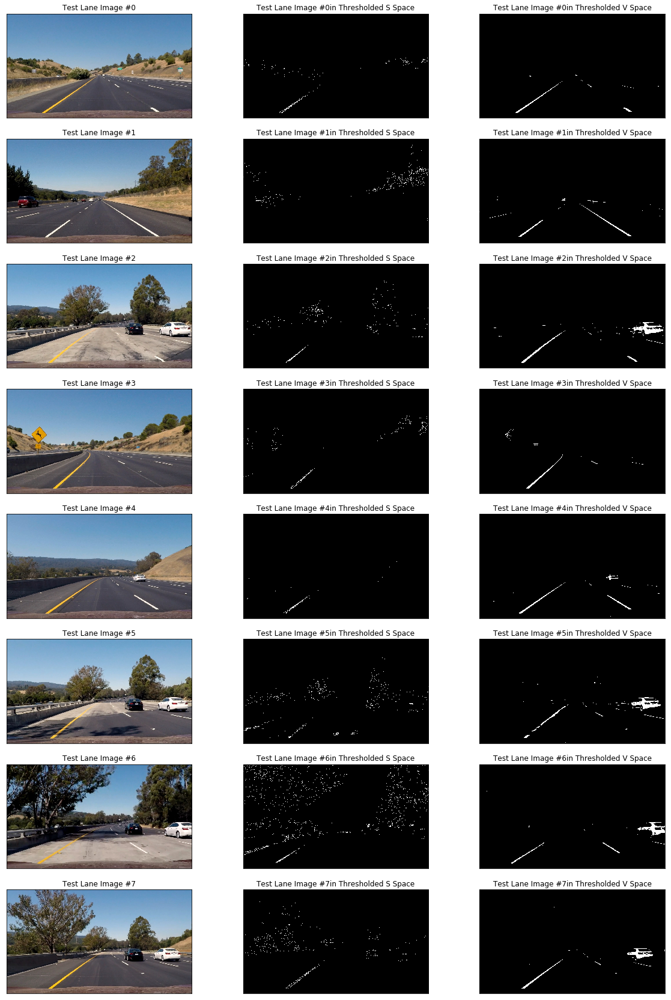

In [7]:
S_thresh = []
V_thresh = []
S_threshVal_yellow = [190, 210]#200]
S_threshVal_white = [0,20]
S_weights = [0.7,0.3]
V_threshVal = 230
f,ax = plt.subplots(len(lanes),3,figsize=(20,30))
for i in range(len(lanes)):
    S_tmp1 = np.ones_like(S_channel[i])
    S_tmp2 = np.ones_like(S_channel[i])    
    V_tmp = np.zeros_like(V_channel[i])
    SThresh_tmp = np.zeros_like(S_channel[i])

#     S_tmp1[(S_channel[i] >= 70) & (S_channel[i] <= 100)] = 1    
    S_tmp1[(S_channel[i] >= S_threshVal_yellow[0])-(S_channel[i] <= S_threshVal_yellow[1])] = 0
    S_tmp2[(S_channel[i] >= S_threshVal_white[0])-(S_channel[i] <= S_threshVal_white[1])] = 0
    V_tmp[(V_channel[i] >= V_threshVal)] = 1    
    
    SThresh_tmp[((S_weights[0]*S_tmp1 + S_weights[1]*S_tmp2) >= 0.5)] = 1
    S_thresh.append(SThresh_tmp)#(S_tmp1+S_tmp2)/2)
    V_thresh.append(V_tmp)    

    ax[i,0].imshow(lanes[i])  
    ax[i,1].imshow(S_thresh[i],cmap="gray")
    ax[i,2].imshow(V_thresh[i],cmap="gray")
    ax[i,0].set_xticks([])
    ax[i,0].set_yticks([])
    ax[i,0].set_title("Test Lane Image #" + str(i))
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Test Lane Image #" + str(i) + "in Thresholded S Space") 
    ax[i,2].set_xticks([])
    ax[i,2].set_yticks([])
    ax[i,2].set_title("Test Lane Image #" + str(i) + "in Thresholded V Space")  

## Step 1c: Combined Thresholds
From the above plots, it can be noticed that thresholding on the V channel alone is sufficient to identify lane lines. Although, the threshold value of 230 seemed to be a little high and may not work well for different lighting conditions.

With that in mind, a combined thresholding was attempted to see if it would make a better fit for all cases.

Combined thresholding is applied by a weighted average of 0.3 for the S-channel thresholds and 0.7 for the V-channel thresholds.

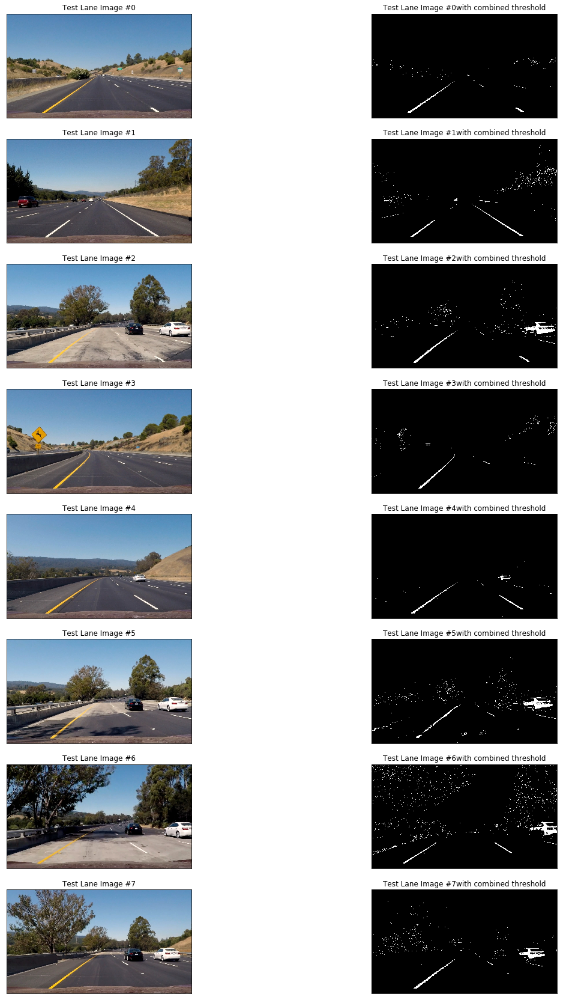

In [8]:
combined_thresh = []
weights = [0.5,0.5]
f,ax = plt.subplots(len(lanes),2,figsize=(20,30))
for i in range(len(lanes)):
    tmp_img1 = np.zeros_like(S_thresh[i])

    tmp_img = weights[0]*S_thresh[i] + weights[1]*V_thresh[i]
    tmp_img1[(tmp_img > 0.40)] = 1
#     tmp_img1[(S_thresh[i] == 1) | (V_thresh[i]==1)] = 1
    combined_thresh.append(tmp_img1)

    ax[i,0].imshow(lanes[i])  
    ax[i,1].imshow(combined_thresh[i],cmap="gray")
    ax[i,0].set_xticks([])
    ax[i,0].set_yticks([])
    ax[i,0].set_title("Test Lane Image #" + str(i))
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Test Lane Image #" + str(i) + "with combined threshold") 

## Step 2: Masking

In [9]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

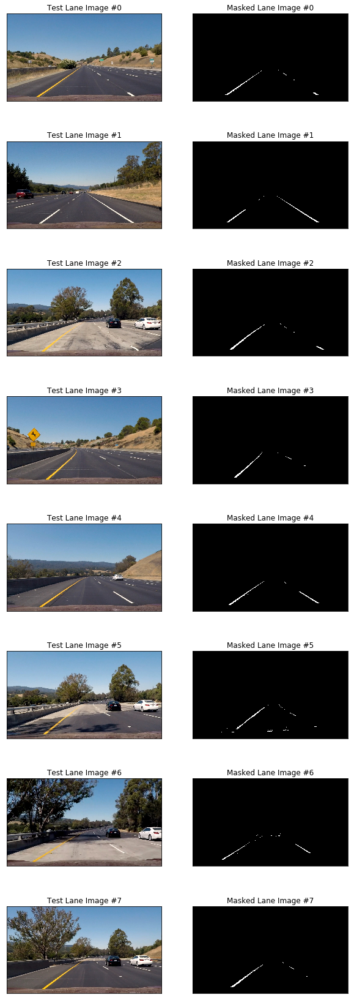

In [10]:
mask = np.array([[((200,lanes[-1].shape[0]-50),
                   (lanes[-1].shape[1]*1/4+250,lanes[-1].shape[0]*0.6),
                   (lanes[-1].shape[1]*3/4-250,lanes[-1].shape[0]*0.6),
                   (lanes[-1].shape[1]-150,lanes[-1].shape[0]-50))]], dtype=np.int32)

f,ax = plt.subplots(len(lanes),2,figsize=(10,30))
masked_imgs = []
for i in range(len(lanes)):
    ax[i,0].imshow(lanes[i])
    masked_imgs.append(region_of_interest(combined_thresh[i], mask)) 
    ax[i,1].imshow(masked_imgs[i],cmap="gray")  
    ax[i,0].set_xticks([])
    ax[i,0].set_yticks([])
    ax[i,0].set_title("Test Lane Image #" + str(i))
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Masked Lane Image #" + str(i))    

## Step 3: Perspective Transform on Lane Lines
Now that we have the camera & distortion matrices, we can perform a perspective transform to get a bird's eye (top) view of the lane lines. We define the look ahead trapezoid in the src_pts array.

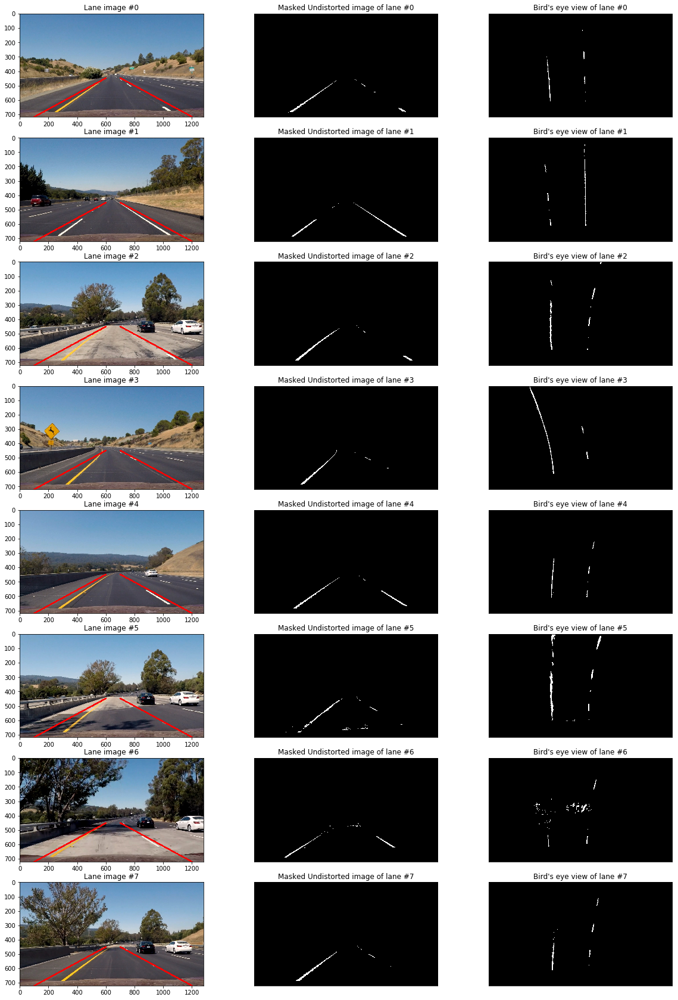

In [11]:
# src_pts = np.float32([[200,720],[600,450],[700,450],[1100,720]])
src_pts = np.float32([[100,720],[600,450],[700,450],[1200,720]])
dst_pts = np.float32([[src_pts[1][0]-200,src_pts[0][1]-100],[src_pts[1][0]-200,100],[src_pts[2][0],100],[src_pts[2][0],src_pts[3][1]-100]])

topView = []
lanes_undist = []
f,ax = plt.subplots(len(lanes),3,figsize=(20,30))
for i in range(len(lanes)):
    img = lanes[i].copy()
    img_undist = cv2.undistort(masked_imgs[i], camera_matrix, distortion_matrix, None, camera_matrix)
    lanes_undist.append(img_undist)

    M = cv2.getPerspectiveTransform(src_pts,dst_pts)
    warped = cv2.warpPerspective(lanes_undist[i], M, (img.shape[1],img.shape[0]))#, flags=cv2.INTER_LINEAR)
    topView.append(warped)
    cv2.line(img,tuple(src_pts[0]),tuple(src_pts[1]),(255,0,0),10)
    cv2.line(img,tuple(src_pts[2]),tuple(src_pts[3]),(255,0,0),10)
    
    ax[i,0].imshow(img)
    ax[i,1].imshow(lanes_undist[i],cmap='gray')
    ax[i,2].imshow(warped,cmap='gray')

#     ax[i,0].set_xticks([])
#     ax[i,0].set_yticks([])
    ax[i,0].set_title("Lane image #" + str(i))    
    
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Masked Undistorted image of lane #" + str(i))

    ax[i,2].set_xticks([])
    ax[i,2].set_yticks([])
    ax[i,2].set_title("Bird's eye view of lane #" + str(i))
#     print(topView[i].shape)

## Step-4: Fit a polynomial on the lane lines
From the bird's eye view of the lane lines, we perform a polynomial fit of the non-zero pixels to get the mathematial relationship between the (x,y) coordinates of the non-zero pixels
### 1. We cut out the hood by removing the last 50 pixel rows.
### 2. Get the histogram of the bottom half of the resulting image
### 3. Get the x-coordinate of the columns on the left and right halves of the image that have the max number of white pixels
### 4. Apply windowing and perform steps 2 & 3 for each stacked window to get the (x,y) co-ordinate of the identified lane lines
### 5. Fit a 2nd order polynomial to these co-ordinates for the left and right lane lines

In [12]:
def findLanes(topViewImg, hoodPixLim=50):
    ## Step-6.1
    topView_hood = topViewImg[:topViewImg.shape[0]-hoodPixLim,:]
    
    ## Step-6.2
    histogram = np.sum(topView_hood[np.int(topView_hood.shape[0]/2):,:], axis=0)
    
    ## Step-6.3
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint    
    
    ## Step-6.4
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(topView_hood[0].shape[0]/nwindows)

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base 


    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = topView_hood.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    margin = 100
    minpix = 50

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = topView_hood.shape[0] - (window+1)*window_height
        win_y_high = topView_hood.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    ## Step-6.5 - Fit a second order polynomial to each    
    if len(left_lane_inds) == 0:
        left_fit = []
    else:
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        left_fit = np.polyfit(lefty, leftx, 2)  
        
    if len(right_lane_inds) == 0:
        right_fit = []
    else:
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit

## Step-5: Draw the lanes on the image for visualization

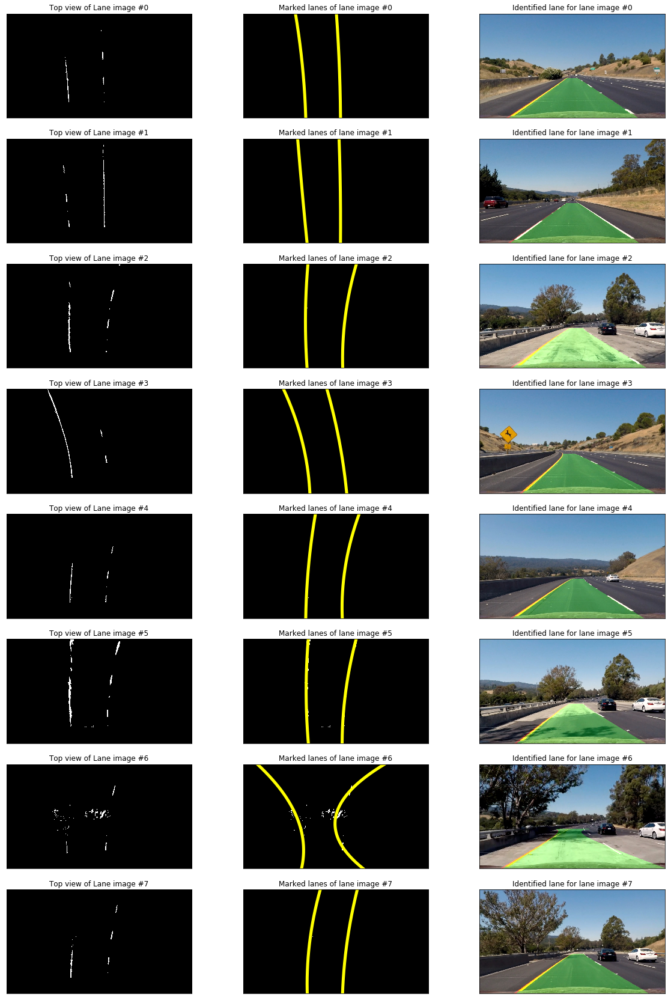

In [13]:
f,ax = plt.subplots(len(lanes),3,figsize=(20,30))

for i in range(len(lanes)):
    left_fit, right_fit = findLanes(topView[i])

    ploty = np.linspace(0, topView[i].shape[0]-1, topView[i].shape[0])

    if left_fit[2] > 0:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        
    if right_fit[2] > 0:
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an output image to draw on and  visualize the result
    marked_lane = np.dstack((topView[i], topView[i], topView[i]))*255 

    #####################################################################################
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(topView[i]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
#     pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
#     pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
#     pts = np.hstack((pts_left, pts_right))#[:,720,:]
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))[:,50:-50,:]

    for j in range(50,pts_left.shape[1]-1):
        cv2.line(color_warp,tuple(pts_left[0,j,:].astype(int)),tuple(pts_left[0,j+1,:].astype(int)),(255,0,0),10)

# #     # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    Minv = cv2.getPerspectiveTransform(dst_pts,src_pts)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (lanes[i].shape[1], lanes[i].shape[0])) 
    # Combine the result with the original image
    undist = cv2.undistort(lanes[i], camera_matrix, distortion_matrix, None, camera_matrix)

    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    dydx_left = np.mean(2*left_fit[0]*ploty + left_fit[1])
    dydx_right = np.mean(2*right_fit[0]*ploty + right_fit[1])
    
    d2ydx2_left = 2*left_fit[0]
    d2ydx2_right = 2*right_fit[0]

    R_left = np.power(1+(dydx_left**2),1.5)/np.abs(d2ydx2_left)
    R_right = np.power(1+(dydx_right**2),1.5)/np.abs(d2ydx2_right)

    ax[i,2].imshow(result)
#     ax[i,2].plot(np.flipud(left_fitx),np.flipud(ploty),'x')#pts_left[:,0],pts_left[:,1],'x')
#     ax[i,2].plot(np.flipud(right_fitx),np.flipud(ploty),'x')#pts_left[:,0],pts_left[:,1],'x')    
    ax[i,2].set_xticks([])
    ax[i,2].set_yticks([])
    ax[i,2].set_title("Identified lane for lane image #" + str(i))
    #####################################################################################    
    
    ax[i,0].imshow(topView[i],cmap="gray")
    ax[i,1].imshow(marked_lane)
    ax[i,1].plot(left_fitx,ploty,color='yellow',linewidth=5)
    ax[i,1].plot(right_fitx,ploty,color='yellow',linewidth=5)    
    ax[i,0].set_xticks([])
    ax[i,0].set_yticks([])
    ax[i,0].set_title("Top view of Lane image #" + str(i))    
    
    ax[i,1].set_xticks([])
    ax[i,1].set_yticks([])
    ax[i,1].set_title("Marked lanes of lane image #" + str(i))

### Make function with Steps 0-5 for the challenge video
While the pipeline is mostly the same as described above, a couple of changes were made based on experimentation to get the best output. These are explained below:
1. V-channel threshold value reduced to 175 from 230. The previous threshold was found to be too high for this video. 175 was work well.
2. There were some parts where the lane line visibility was affected by lighting conditions/shadows from trees. Inorder for smooth and continuous lane detection, previous values were remembered and applied in case current lane lines were not visible.

In [14]:
# # Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

S_threshVal_yellow = [190, 210]#200]
S_threshVal_white = [0,20]
S_weights = [0.7,0.3]
V_threshVal = 230
combined_threshVal = 0.4
weights = [0.5,0.5]

mask = np.array([[((200,lanes[-1].shape[0]-50),
                   (lanes[-1].shape[1]*1/4+250,lanes[-1].shape[0]*0.6),
                   (lanes[-1].shape[1]*3/4-250,lanes[-1].shape[0]*0.6),
                   (lanes[-1].shape[1]-150,lanes[-1].shape[0]-50))]], dtype=np.int32)

src_pts = np.float32([[100,720],[600,450],[700,450],[1200,720]])
dst_pts = np.float32([[src_pts[1][0]-200,src_pts[0][1]-100],[src_pts[1][0]-200,100],[src_pts[2][0],100],[src_pts[2][0],src_pts[3][1]-100]])

M = cv2.getPerspectiveTransform(src_pts,dst_pts)
Minv = cv2.getPerspectiveTransform(dst_pts,src_pts)

ploty = np.linspace(0, lanes[0].shape[0]-1, lanes[0].shape[0])
imgNum = 0

left_fit_prev = []
right_fit_prev = []

def pipeline(image):
    global imgNum, left_fit_prev, right_fit_prev
    delta_L = 0
    delta_R = 0
    
    HSVimg = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    S_tmp1 = np.zeros_like(HSVimg[:,:,1])
    S_tmp2 = np.zeros_like(HSVimg[:,:,1])
    V_tmp = np.zeros_like(HSVimg[:,:,2])    
    SThresh_tmp = np.zeros_like(HSVimg[:,:,1])
    combined_thresh = np.zeros_like(HSVimg[:,:,1])
    
    S_tmp1[(HSVimg[:,:,1] >= S_threshVal_yellow[0])-(HSVimg[:,:,1] <= S_threshVal_yellow[1])] = 0
    S_tmp2[(HSVimg[:,:,1] >= S_threshVal_white[0])-(HSVimg[:,:,1] <= S_threshVal_white[1])] = 0
    V_tmp[(HSVimg[:,:,2] >= V_threshVal)] = 1    
    
    SThresh_tmp[((S_weights[0]*S_tmp1 + S_weights[1]*S_tmp2) >= 0.5)] = 1   
    
    tmp_img = weights[0]*SThresh_tmp + weights[1]*V_tmp
    combined_thresh[(tmp_img > 0.40)] = 1  
    
    masked_img = region_of_interest(combined_thresh, mask)  
    img_undist = cv2.undistort(masked_img, camera_matrix, distortion_matrix, None, camera_matrix)
    warped = cv2.warpPerspective(img_undist, M, (image.shape[1],image.shape[0]))#, flags=cv2.INTER_LINEAR) 
    
    left_fit, right_fit = findLanes(warped,hoodPixLim=50)

    if len(left_fit) > 0:
        if len(left_fit_prev) == 0:
            left_fit_prev = left_fit
        else:
            if np.abs(left_fit[0] - left_fit_prev[0]) <= 1E-2 and np.abs(left_fit[2] - left_fit_prev[2]) <= 100:
                delta_L = np.abs(left_fit[2] - left_fit_prev[2])
                left_fit_prev = left_fit
            else:
                left_fit = left_fit_prev
    else:
        left_fit = left_fit_prev

    if len(right_fit) > 0:
        if len(right_fit_prev) == 0:
            right_fit_prev = right_fit
        else:        
            if np.abs(right_fit[0] - right_fit_prev[0]) <= 1E-2 and np.abs(right_fit[2] - right_fit_prev[2]) <= 100:
                delta_R = np.abs(right_fit[2] - right_fit_prev[2])
                right_fit_prev = right_fit
            else:
                right_fit = right_fit_prev
    else:
        right_fit = right_fit_prev
        
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]  
    
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    
    pts_left = pts_left[:,:-50,:]
    pts_right = pts_right[:,50:,:]        
    pts = np.hstack((pts_left, pts_right))#[:,150:-150,:]

###     Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
#     for j in range(150,pts_left.shape[1]-150):
#         cv2.line(color_warp,tuple(pts_left[0,j,:].astype(int)),tuple(pts_left[0,j+1,:].astype(int)),(255,0,0),10)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    undist = cv2.undistort(image, camera_matrix, distortion_matrix, None, camera_matrix)

    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    y_eval = np.max(ploty)
    
    ## Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    ## Calculate the new radii of curvature
    R_left = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    R_right = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    cv2.putText(result,'R_left = ' + str(R_left), (10,100), cv2.FONT_HERSHEY_SIMPLEX, 0.75, 255)
    cv2.putText(result,'R_right = ' + str(R_right), (900,100), cv2.FONT_HERSHEY_SIMPLEX, 0.75, 255)    

    final_img = result
#     cv2.imwrite("./VideoImgs/frame_"+str(imgNum)+".png",masked_img*255)#final_img)#
#     cv2.imwrite("./VideoImgs/frameOrig_"+str(imgNum)+".png",final_img)#masked_img*255)#
    imgNum = imgNum + 1
    return final_img     

## Test on Project Video

In [15]:
vid = "project_video"
# vid = "challenge_video"
challenge_output = vid + "_output_final.mp4"
clip2 = VideoFileClip(vid + ".mp4")
challenge_clip = clip2.fl_image(pipeline)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video project_video_output_final.mp4
[MoviePy] Writing video project_video_output_final.mp4


100%|█████████▉| 1260/1261 [03:53<00:00,  5.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_final.mp4 

CPU times: user 3min 44s, sys: 28.9 s, total: 4min 13s
Wall time: 3min 54s


## Test on Challenge Video

In [16]:
vid = "challenge_video"
# vid = "challenge_video"
challenge_output = vid + "_output_final.mp4"
clip2 = VideoFileClip(vid + ".mp4")
challenge_clip = clip2.fl_image(pipeline)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output_final.mp4
[MoviePy] Writing video challenge_video_output_final.mp4


100%|██████████| 485/485 [01:30<00:00,  5.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output_final.mp4 

CPU times: user 1min 26s, sys: 11.3 s, total: 1min 37s
Wall time: 1min 31s
